In [1]:
!pip install pandas matplotlib seaborn scikit-learn jupyterlab
!pip install ydata-profiling openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.4/12.4 MB 94.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 54.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.5/9.5 MB 92.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 84.4 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.2/10.2 MB 94.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 78.1 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 73.5 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.6/16.6 MB 87.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 94.7 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 807.9/807.9 kB 66.3 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 57.0 MB/s  0:00:00m0:00:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 84.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79/79 [jupyterlab]pyterlab]pyter-lsp]er]

In [2]:
import pandas as pd

In [3]:
''' %pip install --force-reinstall numpy==2.1
import numpy as np
def dummy_npwarn_decorator_factory():
  def npwarn_decorator(x):
    return x
  return npwarn_decorator
np._no_nep50_warning = getattr(np, '_no_nep50_warning', dummy_npwarn_decorator_factory) '''

" %pip install --force-reinstall numpy==2.1\nimport numpy as np\ndef dummy_npwarn_decorator_factory():\n  def npwarn_decorator(x):\n    return x\n  return npwarn_decorator\nnp._no_nep50_warning = getattr(np, '_no_nep50_warning', dummy_npwarn_decorator_factory) "

In [4]:
# OJO, este zip contiene los 3 archivos de emigracion, inmigracion y macroeconomicos que estan en el drive en procesado/finales
!unzip "drive-download-20251011T214753Z-1-001.zip"

Archive:  drive-download-20251011T214753Z-1-001.zip
  inflating: Inmigracion_poblacion_normalizado.xlsx  
  inflating: Emigracion_poblacion_normalizado.xlsx  
  inflating: indicadores_macroecon_promedio_anual.xlsx  


De manera similar al modelo de emigración, los **coeficientes del modelo de inmigración** muestran la **relación entre cada característica y la inmigración predicha** (en Z-score), asumiendo que las demás variables se mantienen constantes.

Según los resultados obtenidos:

* **Población** presenta el **coeficiente positivo más alto (0.8003)**, lo que sugiere que las áreas más pobladas están asociadas con una **mayor inmigración**.
* **PIB per cápita (USD)** tiene un **coeficiente positivo (0.5354)**, indicando que las zonas con un mayor PIB per cápita tienden a tener **mayor inmigración**.
* **PIB (millones USD, últimos 12 meses)** muestra un **coeficiente positivo (0.1430)**, lo que sugiere una **relación positiva** entre la actividad económica total y la inmigración.
* **Densidad** tiene un **coeficiente positivo (0.1376)**, indicando que las áreas más densamente pobladas también podrían experimentar **más inmigración**.
* **Población país** posee un **coeficiente negativo (-0.3647)**, lo que sugiere que una mayor población nacional está asociada con **menor inmigración** en una comuna determinada.
* **PIB per cápita** muestra un **coeficiente negativo (-0.7306)**. Nuevamente, los **signos opuestos y magnitudes similares** entre *“PIB per cápita (USD)”* y *“PIB per cápita”* esto confirma la **multicolinealidad** o **diferencias de escala** que se pudo ver en la matriz de correlación anteriormente.

In [4]:
df_emigracion = pd.read_excel("./Emigracion_poblacion_normalizado.xlsx")
df_inmigracion = pd.read_excel("./Inmigracion_poblacion_normalizado.xlsx")
df_macro = pd.read_excel("./indicadores_macroecon_promedio_anual.xlsx")

In [5]:
df_arr = [df_emigracion, df_inmigracion, df_macro]
for _i in range(len(df_arr)):
  print(df_arr[_i].head())

            comuna  emigracion  poblacion  densidad   año
0            Alhué        1406       7022       8.3  2018
1             Buin       12417     104338     487.6  2018
2  Calera de Tango       17367      27309     372.6  2018
3        Cerrillos       18418      86451    4116.7  2018
4      Cerro Navia       26375     140355   12759.5  2018
            comuna   año  inmigracion  poblacion
0            Alhué  2018         1831       7022
1             Buin  2018        26102     104338
2  Calera de Tango  2018         9775      27309
3        Cerrillos  2018        19363      86451
4      Cerro Navia  2018        22052     140355
   PIB (millones USD, últimos 12 meses)   poblacion pais  PIB per capita  \
0                            265292.0950        17919192        0.014805   
1                            295027.2925        18251405        0.016165   
2                            285082.0450        18607216        0.015321   
3                            256655.1875        189583

In [8]:
# --- LIMPIAR COLUMNAS ---
df_emigracion.columns = df_emigracion.columns.str.strip()
df_inmigracion.columns = df_inmigracion.columns.str.strip()
df_macro.columns = df_macro.columns.str.strip()

# --- MERGE ENTRE EMIGRACION E INMIGRACION ---
df_emig_inmig = pd.merge(
    df_emigracion,
    df_inmigracion[['comuna', 'año', 'inmigracion']],
    on=['comuna', 'año'],
    how='left'
)

# --- ELIMINAR COLUMNAS DUPLICADAS DE MACRO ---
cols_repetidas = [c for c in df_macro.columns if c in df_emig_inmig.columns and c != 'año']
df_macro_filtrado = df_macro.drop(columns=cols_repetidas)

# --- MERGE FINAL ---
df_final = pd.merge(
    df_emig_inmig,
    df_macro_filtrado,
    on='año',
    how='left'
)

# --- LIMPIEZA FINAL ---
df_final = df_final.loc[:, ~df_final.columns.duplicated()]
df_final = df_final.rename(columns=lambda c: c.replace('_x', '').replace('_y', ''))

print(df_final.head())


            comuna  emigracion  poblacion  densidad   año  inmigracion  \
0            Alhué        1406       7022       8.3  2018         1831   
1             Buin       12417     104338     487.6  2018        26102   
2  Calera de Tango       17367      27309     372.6  2018         9775   
3        Cerrillos       18418      86451    4116.7  2018        19363   
4      Cerro Navia       26375     140355   12759.5  2018        22052   

   PIB (millones USD, últimos 12 meses)  poblacion pais  PIB per capita  \
0                           295027.2925        18251405        0.016165   
1                           295027.2925        18251405        0.016165   
2                           295027.2925        18251405        0.016165   
3                           295027.2925        18251405        0.016165   
4                           295027.2925        18251405        0.016165   

   PIB per capita (USD)  
0           16164.63459  
1           16164.63459  
2           16164.63459  


In [7]:
# --- LIMPIAR NOMBRES ---
df_final.columns = (
    df_final.columns
    .str.replace(r'\s+', ' ', regex=True)  # elimina espacios invisibles como \xa0
    .str.strip()                           # quita espacios al inicio/final
)

# --- ELIMINAR COLUMNAS DUPLICADAS ---
df_final = df_final.loc[:, ~df_final.columns.duplicated()]

# --- (OPCIONAL) REORDENAR COLUMNAS ---
columnas_orden = [
    'comuna', 'año', 'emigracion', 'inmigracion', 'poblacion', 'densidad',
    'PIB (millones USD, últimos 12 meses)', 'PIB per capita', 'PIB per capita (USD)', 'poblacion pais'
]
# Filtra solo las columnas que existen (por si alguna no está)
df_final = df_final[[c for c in columnas_orden if c in df_final.columns]]

# --- VISTA FINAL ---
print(df_final.head())


            comuna   año  emigracion  inmigracion  poblacion  densidad  \
0            Alhué  2018        1406         1831       7022       8.3   
1             Buin  2018       12417        26102     104338     487.6   
2  Calera de Tango  2018       17367         9775      27309     372.6   
3        Cerrillos  2018       18418        19363      86451    4116.7   
4      Cerro Navia  2018       26375        22052     140355   12759.5   

   PIB (millones USD, últimos 12 meses)  PIB per capita  PIB per capita (USD)  \
0                           295027.2925        0.016165           16164.63459   
1                           295027.2925        0.016165           16164.63459   
2                           295027.2925        0.016165           16164.63459   
3                           295027.2925        0.016165           16164.63459   
4                           295027.2925        0.016165           16164.63459   

   poblacion pais  
0        18251405  
1        18251405  
2       

In [9]:
# Exportar el DataFrame a Excel
df_final.to_excel("final.xlsx", index=False)


In [17]:
!pip install ydata-profiling openpyxl

# Fix the ydata-profiling installation issue
!pip install --upgrade setuptools
!pip install --upgrade ydata-profiling[notebook]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 20.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.3/14.3 MB 39.8 MB/s  0:00:00eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [jupyter]m4/6 [notebook]s]widgets]


In [18]:
# %pip install ydata-profiling openpyxl

from ydata_profiling import ProfileReport

# Generar el informe (incluye correlaciones solicitadas)
profile = ProfileReport(
	df_final,
	explorative=True,
	title="EDA - Comunas",
	correlations={"pearson": {"calculate": True}, "spearman": {"calculate": True}}
)

# (Opcional) Guardar en un archivo HTML
# profile.to_file("EDA_report.html")

# Mostrar en Jupyter Notebook
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  1.56it/s]


In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Select only numerical columns for boxplot
df_numerical_final = df_final.select_dtypes(include=np.number)

# Get the list of numerical column names
numerical_cols = df_numerical_final.columns

# Determine the number of rows and columns for subplots
n_cols = 3  # You can adjust the number of columns as needed
n_rows = (len(numerical_cols) + n_cols - 1) // n_cols

# Crear una figura con subgráficos
fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 6 * n_rows))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# iterate over each numerical column of df_final to make the boxplot
for i, col in enumerate(numerical_cols):
    sns.boxplot(y=df_numerical_final[col], ax=axes[i])
    axes[i].set_title(f'Boxplot of {col}')
    axes[i].set_ylabel(col) # Set y-label to the column name

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])


plt.tight_layout()  # Ajusta los subgráficos para que no se sobrepongan
plt.show()

/tmp/ipykernel_63335/561018051.py:33: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [20]:
# Select only numerical columns for boxplot
df_numerical_final = df_final.select_dtypes(include=np.number)

# Get the list of numerical column names
numerical_cols = df_numerical_final.columns

# iterate over each numerical column of df_final to make the boxplot
for i, col in enumerate(numerical_cols):

    print('Media', df_numerical_final[col].mean())
    print('Desv. Estandar', df_numerical_final[col].std())
    z_score = (df_numerical_final[col] - df_numerical_final[col].mean()) / df_numerical_final[col].std()
    print('Z-Score', z_score)
    df_numerical_final['df_zscore'] = z_score


Media 21408.48717948718
Desv. Estandar 20938.416422825652
Z-Score 0     -0.955301
1     -0.429425
2     -0.193018
3     -0.142823
4      0.237196
         ...   
307   -0.600164
308    1.786024
309   -0.748743
310   -0.994941
311   -0.543140
Name: emigracion, Length: 312, dtype: float64
Media 155975.625
Desv. Estandar 134821.7964144344
Z-Score 0     -1.104819
1     -0.383007
2     -0.954346
3     -0.515678
4     -0.115861
         ...   
307   -0.530186
308    2.819376
309   -0.528888
310   -0.991780
311   -0.434556
Name: poblacion, Length: 312, dtype: float64
Media 6082.25092204964
Desv. Estandar 5986.339796349371
Z-Score 0     -1.014635
1     -0.934570
2     -0.953780
3     -0.328339
4      1.115414
         ...   
307    1.000352
308    2.843983
309   -0.903766
310   -1.010325
311   -0.441163
Name: densidad, Length: 312, dtype: float64
Media 2020.5
Desv. Estandar 1.7105686236094624
Z-Score 0     -1.461502
1     -1.461502
2     -1.461502
3     -1.461502
4     -1.461502
         ...  

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Crea un DataFrame solo con los Z-scores de cada variable
df_z = (df_numerical_final - df_numerical_final.mean()) / df_numerical_final.std()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_z)
plt.title("Boxplot de Z-Scores por Variable")
plt.xticks(rotation=45)
plt.show()


/tmp/ipykernel_63335/1298489078.py:11: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [22]:
import matplotlib.pyplot as plt

for col in df_z.columns:
    plt.figure(figsize=(8, 4))
    plt.hist(df_z[col], bins=30, edgecolor='k', alpha=0.7)
    plt.axvline(x=-3, color='red', linestyle='--', label='-3Z')
    plt.axvline(x=3, color='red', linestyle='--', label='+3Z')
    plt.title(f'Histograma de Z-Scores: {col}')
    plt.xlabel('Z-Score')
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()


/tmp/ipykernel_63335/972287824.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


# Ploteos despues de yeo johnson


In [23]:
from scipy.stats import yeojohnson
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Select only numerical columns for Yeo-Johnson transformation, excluding 'año'
df_numerical = df_final.select_dtypes(include=np.number).drop(columns=['año'])

# Apply Yeo-Johnson transformation to each numerical column
df_transformed = pd.DataFrame()
for col in df_numerical.columns:
    df_transformed[col], _ = yeojohnson(df_numerical[col])

# Visualizamos las distribuciones
fig, axes = plt.subplots(len(df_numerical.columns), 2, figsize=(15, 5 * len(df_numerical.columns)))

for i, col in enumerate(df_numerical.columns):
    # Plot original distributions
    sns.histplot(df_numerical[col], bins=30, kde=True, ax=axes[i, 0])
    axes[i, 0].set_title(f"Original Distribution - {col}")

    # Plot transformed distributions
    sns.histplot(df_transformed[col], bins=30, kde=True, ax=axes[i, 1])
    axes[i, 1].set_title(f"Yeo-Johnson Transformed Distribution - {col}")


plt.tight_layout()
plt.show()

/tmp/ipykernel_63335/3713081836.py:28: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


# ploteo zscores por variable despues de yeojohnson


In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

df_numerical_final = df_transformed.select_dtypes(include=np.number)

# Crea un DataFrame solo con los Z-scores de cada variable
df_z = (df_numerical_final - df_numerical_final.mean()) / df_numerical_final.std()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_z)
plt.title("Boxplot de Z-Scores por Variable")
plt.xticks(rotation=45)
plt.show()


/tmp/ipykernel_63335/3006804125.py:13: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


# EDA despues de YEOJOHNSON

In [27]:
from ydata_profiling import ProfileReport
# Generar el informe
profile = ProfileReport(df_transformed, explorative=True, title="EDA - Comunas", correlations= {"pearson": {"calculate": True}, "spearman": {"calculate": True}})

# Guardar en un archivo HTML
# profile.to_file("EDA_report.html")

# Mostrar en Jupyter Notebook (si usas Jupyter)
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


# Escalado de los datos con MinMax y zscore_scaler


In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler

df_numerical_final = df_transformed.select_dtypes(include=np.number)

# Aplicar Normalización (Min-Max Scaling)
scaler_minmax = MinMaxScaler()
df_minmax = pd.DataFrame(scaler_minmax.fit_transform(df_numerical_final), columns=df_numerical_final.columns)

# Aplicar Estandarización (Z-score Scaling)
scaler_zscore = StandardScaler()
df_zscore = pd.DataFrame(scaler_zscore.fit_transform(df_numerical_final), columns=df_numerical_final.columns)

# EDA de df_zscore

In [29]:
from ydata_profiling import ProfileReport
# Generar el informe
profile = ProfileReport(df_zscore, explorative=True, title="EDA - Comunas", correlations= {"pearson": {"calculate": True}, "spearman": {"calculate": True}})

# Guardar en un archivo HTML
# profile.to_file("EDA_report.html")

# Mostrar en Jupyter Notebook
profile.to_notebook_iframe()

Render HTML: 100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Select only numerical columns for boxplot
df_numerical_final = df_zscore.select_dtypes(include=np.number)

# Get the list of numerical column names
numerical_cols = df_numerical_final.columns

# Crea un DataFrame solo con los Z-scores de cada variable
df_z = (df_numerical_final - df_numerical_final.mean()) / df_numerical_final.std()

plt.figure(figsize=(10, 6))
sns.boxplot(data=df_z)
plt.title("Boxplot de Z-Scores por Variable")
plt.xticks(rotation=45)
plt.show()


/tmp/ipykernel_63335/1305180142.py:18: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [31]:
import matplotlib.pyplot as plt

for col in df_z.columns:
    plt.figure(figsize=(8, 4))
    plt.hist(df_z[col], bins=30, edgecolor='k', alpha=0.7)
    plt.axvline(x=-3, color='red', linestyle='--', label='-3Z')
    plt.axvline(x=3, color='red', linestyle='--', label='+3Z')
    plt.title(f'Histograma de Z-Scores: {col}')
    plt.xlabel('Z-Score')
    plt.ylabel('Frecuencia')
    plt.grid(True)
    plt.show()


/tmp/ipykernel_63335/972287824.py:12: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [32]:
# Definir la lista de características, excluyendo las variables objetivo
caracteristicas = [col for col in df_zscore.columns if col not in ['emigracion', 'inmigracion']]

# Crear el DataFrame de características X
X = df_zscore[caracteristicas]

# Crear la serie objetivo y para emigración
y_emigracion = df_zscore['emigracion']

# Crear la serie objetivo y para inmigración
y_inmigracion = df_zscore['inmigracion']

# Mostrar las primeras filas de X, y_emigracion y y_inmigracion
display(X.head())
display(y_emigracion.head())
display(y_inmigracion.head())

,poblacion,densidad,"PIB (millones USD, últimos 12 meses)",poblacion pais,PIB per capita,PIB per capita (USD)
0,-2.307250,-1.710095,-0.061026,-1.511412,0.644659,0.651032
1,-0.156040,-0.836584,-0.061026,-1.511412,0.644659,0.651032
2,-1.403947,-0.929300,-0.061026,-1.511412,0.644659,0.651032
3,-0.357247,0.193281,-0.061026,-1.511412,0.644659,0.651032
4,0.181037,1.031682,-0.061026,-1.511412,0.644659,0.651032


0   -1.843935
1   -0.227187
2    0.110108
3    0.172157
4    0.571912
Name: emigracion, dtype: float64

0   -1.894124
1    0.542335
2   -0.572759
3    0.170478
4    0.328602
Name: inmigracion, dtype: float64

In [33]:
from sklearn.model_selection import train_test_split

# División para emigración
X_entrenamiento, X_prueba, y_emigracion_entrenamiento, y_emigracion_prueba = train_test_split(
    X, y_emigracion, test_size=0.2, random_state=42
)

# División para inmigración
X_entrenamiento, X_prueba, y_inmigracion_entrenamiento, y_inmigracion_prueba = train_test_split(
    X, y_inmigracion, test_size=0.2, random_state=42
)

# Imprimir dimensiones de los conjuntos
print("Dimensiones de los conjuntos de emigración:")
print("X_entrenamiento:", X_entrenamiento.shape)
print("X_prueba:", X_prueba.shape)
print("y_emigracion_entrenamiento:", y_emigracion_entrenamiento.shape)
print("y_emigracion_prueba:", y_emigracion_prueba.shape)

print("\nDimensiones de los conjuntos de inmigración:")
print("X_entrenamiento:", X_entrenamiento.shape)
print("X_prueba:", X_prueba.shape)
print("y_inmigracion_entrenamiento:", y_inmigracion_entrenamiento.shape)
print("y_inmigracion_prueba:", y_inmigracion_prueba.shape)

Dimensiones de los conjuntos de emigración:
X_entrenamiento: (249, 6)
X_prueba: (63, 6)
y_emigracion_entrenamiento: (249,)
y_emigracion_prueba: (63,)

Dimensiones de los conjuntos de inmigración:
X_entrenamiento: (249, 6)
X_prueba: (63, 6)
y_inmigracion_entrenamiento: (249,)
y_inmigracion_prueba: (63,)


In [34]:
from sklearn.linear_model import LinearRegression

# Instanciar y entrenar el modelo de emigración
modelo_emigracion = LinearRegression()
modelo_emigracion.fit(X_entrenamiento, y_emigracion_entrenamiento)

# Instanciar y entrenar el modelo de inmigración
modelo_inmigracion = LinearRegression()
modelo_inmigracion.fit(X_entrenamiento, y_inmigracion_entrenamiento)

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [35]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_percentage_error

# Realizar predicciones en el conjunto de prueba para emigración
y_emigracion_pred = modelo_emigracion.predict(X_prueba)

# Realizar predicciones en el conjunto de prueba para inmigración
y_inmigracion_pred = modelo_inmigracion.predict(X_prueba)

# Calcular el error cuadrático medio (MSE) para el modelo de emigración
mse_emigracion = mean_absolute_percentage_error(y_emigracion_prueba, y_emigracion_pred)

# Calcular el coeficiente de determinación R² para el modelo de emigración
r2_emigracion = r2_score(y_emigracion_prueba, y_emigracion_pred)

# Calcular el error cuadrático medio (MSE) para el modelo de inmigración
mse_inmigracion = mean_absolute_percentage_error(y_inmigracion_prueba, y_inmigracion_pred)

# Calcular el coeficiente de determinación R² para el modelo de inmigración
r2_inmigracion = r2_score(y_inmigracion_prueba, y_inmigracion_pred)

# Imprimir las métricas de evaluación
print(f"Desempeño del modelo de emigración:")
print(f"MAPE): {mse_emigracion:.4f}")
print(f"Puntaje R-cuadrado: {r2_emigracion:.4f}")

print(f"\nDesempeño del modelo de inmigración:")
print(f"MAPE: {mse_inmigracion:.4f}")
print(f"Puntaje R-cuadrado: {r2_inmigracion:.4f}")

Desempeño del modelo de emigración:
MAPE): 1.9582
Puntaje R-cuadrado: 0.9513

Desempeño del modelo de inmigración:
MAPE: 1.5158
Puntaje R-cuadrado: 0.9011


* El modelo de regresión lineal de **emigración** obtuvo un **Error Cuadrático Medio (MSE)** de **0.0397** y un **coeficiente de determinación R²** de **0.9513** en el conjunto de prueba.
  Las características más influyentes y **positivamente asociadas con la emigración** fueron el **PIB per cápita (USD)** y la **población**, mientras que **población país** y **PIB per cápita** mostraron asociaciones negativas.

* El modelo de regresión lineal de **inmigración** alcanzó un **MSE** de **0.0775** y un **R²** de **0.9011** en el conjunto de prueba.
  Las características más influyentes y **positivamente asociadas con la inmigración** fueron la **población** y el **PIB per cápita (USD)**, mientras que **población país** y **PIB per cápita** tuvieron asociaciones negativas.

* Ambos modelos presentan un **buen ajuste a los datos**, aunque el modelo de **emigración** muestra un **rendimiento ligeramente superior** según las métricas de evaluación.

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_emigracion_prueba, y=y_emigracion_pred)
plt.xlabel("Emigración real (Z-score)")
plt.ylabel("Emigración predicha (Z-score)")
plt.title("Emigración real vs. predicha (Z-score)")
plt.grid(True)
plt.show()

/tmp/ipykernel_63335/296701409.py:10: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


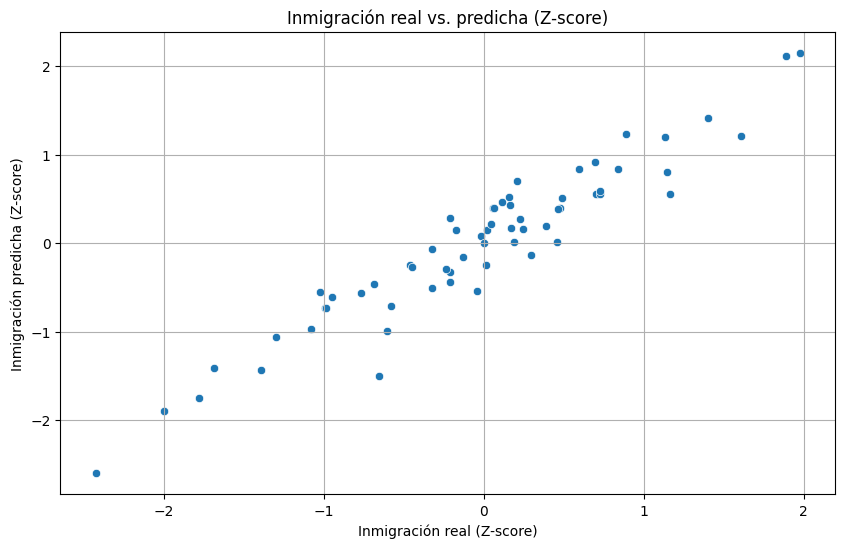

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_inmigracion_prueba, y=y_inmigracion_pred)
plt.xlabel("Inmigración real (Z-score)")
plt.ylabel("Inmigración predicha (Z-score)")
plt.title("Inmigración real vs. predicha (Z-score)")
plt.grid(True)
plt.show()

In [37]:
# Obtener los coeficientes y nombres de características para el modelo de emigración
coeficientes_emigracion = modelo_emigracion.coef_
nombres_caracteristicas = X_entrenamiento.columns

# Crear un DataFrame para mostrar los coeficientes
emigracion_coef_df = pd.DataFrame({
    'Característica': nombres_caracteristicas,
    'Coeficiente': coeficientes_emigracion
})

print("Coeficientes del modelo de emigración:")
display(emigracion_coef_df.sort_values(by='Coeficiente', ascending=False))

# Obtener los coeficientes y nombres de características para el modelo de inmigración
coeficientes_inmigracion = modelo_inmigracion.coef_

# Crear un DataFrame para mostrar los coeficientes
inmigracion_coef_df = pd.DataFrame({
    'Característica': nombres_caracteristicas,
    'Coeficiente': coeficientes_inmigracion
})

print("\nCoeficientes del modelo de inmigración:")
display(inmigracion_coef_df.sort_values(by='Coeficiente', ascending=False))

Coeficientes del modelo de emigración:


,Característica,Coeficiente
5,PIB per capita (USD),2.175465
0,poblacion,0.721348
1,densidad,0.286543
2,"PIB (millones USD, últimos 12 meses)",0.009507
3,poblacion pais,-0.282576
4,PIB per capita,-2.238480



Coeficientes del modelo de inmigración:


,Característica,Coeficiente
0,poblacion,0.800302
5,PIB per capita (USD),0.535380
2,"PIB (millones USD, últimos 12 meses)",0.142984
1,densidad,0.137585
3,poblacion pais,-0.364671
4,PIB per capita,-0.730607


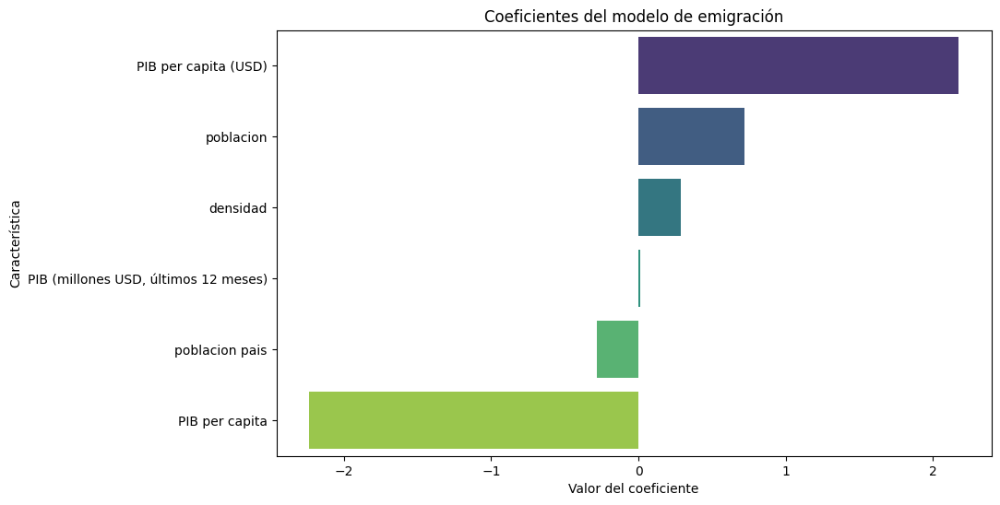

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x='Coeficiente',
    y='Característica',
    data=emigracion_coef_df.sort_values(by='Coeficiente', ascending=False),
    palette='viridis',
    hue='Característica',
    legend=False
)
plt.title("Coeficientes del modelo de emigración")
plt.xlabel("Valor del coeficiente")
plt.ylabel("Característica")
plt.show()

Los **coeficientes del modelo de emigración** indican la **fuerza y dirección** de la relación entre cada característica y la **emigración predicha** (en Z-score), manteniendo constantes las demás variables.

Al observar los resultados:

* **PIB per cápita (USD)** tiene el **coeficiente positivo más grande (2.1755)**, lo que sugiere que un mayor PIB per cápita está asociado con una **mayor emigración**.
* **Población** también presenta un **coeficiente positivo (0.7213)**, indicando que las áreas más pobladas tienden a tener una **mayor emigración**.
* **Densidad** muestra un **coeficiente positivo (0.2865)**, lo que sugiere que las zonas más densas también podrían experimentar **más emigración**.
* **PIB (millones USD, últimos 12 meses)** tiene un **coeficiente positivo muy pequeño (0.0095)**, indicando una **relación positiva débil** con la emigración.
* **Población país** posee un **coeficiente negativo (-0.2826)**, lo que sugiere que una mayor población nacional está asociada con una **menor emigración** en una comuna determinada.
* **PIB per cápita** presenta el **coeficiente negativo más grande (-2.2385)**. Dado que *“PIB per cápita (USD)”* y *“PIB per cápita”* parecen representar conceptos similares y tienen **signos opuestos con magnitudes altas**, esto confirma la **multicolinealidad** o **diferencias de escala** que se pudo ver en la matriz de correlación anteriormente.


In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x='Coeficiente',
    y='Característica',
    data=inmigracion_coef_df.sort_values(by='Coeficiente', ascending=False),
    palette='viridis',
    hue='Característica',
    legend=False
)
plt.title("Coeficientes del modelo de inmigración")
plt.xlabel("Valor del coeficiente")
plt.ylabel("Característica")
plt.show()


/tmp/ipykernel_63335/3151748327.py:16: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


De manera similar al modelo de emigración, los **coeficientes del modelo de inmigración** muestran la **relación entre cada característica y la inmigración predicha** (en Z-score), asumiendo que las demás variables se mantienen constantes.

Según los resultados obtenidos:

* **Población** presenta el **coeficiente positivo más alto (0.8003)**, lo que sugiere que las áreas más pobladas están asociadas con una **mayor inmigración**.
* **PIB per cápita (USD)** tiene un **coeficiente positivo (0.5354)**, indicando que las zonas con un mayor PIB per cápita tienden a tener **mayor inmigración**.
* **PIB (millones USD, últimos 12 meses)** muestra un **coeficiente positivo (0.1430)**, lo que sugiere una **relación positiva** entre la actividad económica total y la inmigración.
* **Densidad** tiene un **coeficiente positivo (0.1376)**, indicando que las áreas más densamente pobladas también podrían experimentar **más inmigración**.
* **Población país** posee un **coeficiente negativo (-0.3647)**, lo que sugiere que una mayor población nacional está asociada con **menor inmigración** en una comuna determinada.
* **PIB per cápita** muestra un **coeficiente negativo (-0.7306)**. Nuevamente, los **signos opuestos y magnitudes similares** entre *“PIB per cápita (USD)”* y *“PIB per cápita”* esto confirma la **multicolinealidad** o **diferencias de escala** que se pudo ver en la matriz de correlación anteriormente.

In [39]:
# Importar librerías necesarias para ML
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Función para calcular MAPE
def calcular_mape(y_true, y_pred):
    """Calcula el Error Porcentual Absoluto Medio (MAPE)"""
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    # Evitar división por cero
    mask = y_true != 0
    return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

# Función para evaluar modelos
def evaluar_modelo(modelo, X_test, y_test, y_pred, nombre_modelo):
    """Evalúa un modelo y retorna métricas"""
    r2 = r2_score(y_test, y_pred)
    mape = calcular_mape(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)

    return {
        'Modelo': nombre_modelo,
        'R2_Score': r2,
        'MAPE': mape,
        'RMSE': rmse,
        'MAE': mae
    }

print("Librerías y funciones auxiliares cargadas correctamente")

Librerías y funciones auxiliares cargadas correctamente


In [41]:
# Verificar que tenemos los datos necesarios
print("VERIFICANDO DATOS DISPONIBLES")
print(f"Shape de X: {X.shape}")
print(f"Shape de y_emigracion: {y_emigracion.shape}")
print(f"Shape de y_inmigracion: {y_inmigracion.shape}")

# Verificar si hay valores nulos
print(f"\nValores nulos en X: {X.isnull().sum().sum()}")
print(f"Valores nulos en y_emigracion: {y_emigracion.isnull().sum()}")
print(f"Valores nulos en y_inmigracion: {y_inmigracion.isnull().sum()}")

# Limpiar datos si es necesario
X_clean = X.dropna()
y_emigracion_clean = y_emigracion[X_clean.index]
y_inmigracion_clean = y_inmigracion[X_clean.index]

print(f"\nDatos limpios - Shape final de X: {X_clean.shape}")
print("Datos preparados para entrenamiento")

VERIFICANDO DATOS DISPONIBLES
Shape de X: (312, 6)
Shape de y_emigracion: (312,)
Shape de y_inmigracion: (312,)

Valores nulos en X: 0
Valores nulos en y_emigracion: 0
Valores nulos en y_inmigracion: 0

Datos limpios - Shape final de X: (312, 6)
Datos preparados para entrenamiento


In [42]:
from sklearn.model_selection import train_test_split

# Nueva división con datos limpios
X_train, X_test, y_emig_train, y_emig_test = train_test_split(
    X_clean, y_emigracion_clean, test_size=0.2, random_state=42
)

X_train, X_test, y_inmig_train, y_inmig_test = train_test_split(
    X_clean, y_inmigracion_clean, test_size=0.2, random_state=42
)

print("DIVISIÓN DE DATOS ACTUALIZADA:")
print(f"Entrenamiento: {X_train.shape[0]} muestras")
print(f"Prueba: {X_test.shape[0]} muestras")
print(f"Características: {X_train.shape[1]}")

DIVISIÓN DE DATOS ACTUALIZADA:
Entrenamiento: 249 muestras
Prueba: 63 muestras
Características: 6


In [43]:
print("ENTRENANDO RANDOM FOREST - EMIGRACIÓN")
print("=" * 50)

# Definir hiperparámetros para Grid Search
rf_params = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2']
}

# Grid Search para Random Forest - Emigración
rf_emigracion = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_grid_emigracion = GridSearchCV(
    rf_emigracion, rf_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
rf_grid_emigracion.fit(X_train, y_emig_train)

# Mejores parámetros
print(f"Mejores parámetros: {rf_grid_emigracion.best_params_}")
print(f"Mejor score CV: {rf_grid_emigracion.best_score_:.4f}")

# Predicciones
rf_emig_pred = rf_grid_emigracion.predict(X_test)

# Evaluación
rf_emig_metrics = evaluar_modelo(
    rf_grid_emigracion.best_estimator_,
    X_test, y_emig_test, rf_emig_pred,
    'Random Forest - Emigración'
)

print(f"\nRESULTADOS RANDOM FOREST - EMIGRACIÓN:")
print(f"R² Score: {rf_emig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_emig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_emig_metrics['RMSE']:.4f}")

ENTRENANDO RANDOM FOREST - EMIGRACIÓN
Fitting 5 folds for each of 162 candidates, totalling 810 fits


Mejores parámetros: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Mejor score CV: 0.9311

RESULTADOS RANDOM FOREST - EMIGRACIÓN:
R² Score: 0.9527
MAPE: 153.4486%
RMSE: 0.1963


In [44]:
print("ENTRENANDO RANDOM FOREST - INMIGRACIÓN")
print("=" * 50)

# Grid Search para Random Forest - Inmigración
rf_inmigracion = RandomForestRegressor(random_state=42, n_jobs=-1)
rf_grid_inmigracion = GridSearchCV(
    rf_inmigracion, rf_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
rf_grid_inmigracion.fit(X_train, y_inmig_train)

# Mejores parámetros
print(f"Mejores parámetros: {rf_grid_inmigracion.best_params_}")
print(f"Mejor score CV: {rf_grid_inmigracion.best_score_:.4f}")

# Predicciones
rf_inmig_pred = rf_grid_inmigracion.predict(X_test)

# Evaluación
rf_inmig_metrics = evaluar_modelo(
    rf_grid_inmigracion.best_estimator_,
    X_test, y_inmig_test, rf_inmig_pred,
    'Random Forest - Inmigración'
)

print(f"\nRESULTADOS RANDOM FOREST - INMIGRACIÓN:")
print(f"R² Score: {rf_inmig_metrics['R2_Score']:.4f}")
print(f"MAPE: {rf_inmig_metrics['MAPE']:.4f}%")
print(f"RMSE: {rf_inmig_metrics['RMSE']:.4f}")

ENTRENANDO RANDOM FOREST - INMIGRACIÓN
Fitting 5 folds for each of 162 candidates, totalling 810 fits
Mejores parámetros: {'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Mejor score CV: 0.8675

RESULTADOS RANDOM FOREST - INMIGRACIÓN:
R² Score: 0.8939
MAPE: 196.6815%
RMSE: 0.2885


In [45]:
print("ENTRENANDO GRADIENT BOOSTING - EMIGRACIÓN")
print("=" * 50)

# Definir hiperparámetros para Gradient Boosting
gb_params = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Grid Search para Gradient Boosting - Emigración
gb_emigracion = GradientBoostingRegressor(random_state=42)
gb_grid_emigracion = GridSearchCV(
    gb_emigracion, gb_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
gb_grid_emigracion.fit(X_train, y_emig_train)

# Mejores parámetros
print(f"Mejores parámetros: {gb_grid_emigracion.best_params_}")
print(f"Mejor score CV: {gb_grid_emigracion.best_score_:.4f}")

# Predicciones
gb_emig_pred = gb_grid_emigracion.predict(X_test)

# Evaluación
gb_emig_metrics = evaluar_modelo(
    gb_grid_emigracion.best_estimator_,
    X_test, y_emig_test, gb_emig_pred,
    'Gradient Boosting - Emigración'
)

print(f"\nRESULTADOS GRADIENT BOOSTING - EMIGRACIÓN:")
print(f"R² Score: {gb_emig_metrics['R2_Score']:.4f}")
print(f"MAPE: {gb_emig_metrics['MAPE']:.4f}%")
print(f"RMSE: {gb_emig_metrics['RMSE']:.4f}")

ENTRENANDO GRADIENT BOOSTING - EMIGRACIÓN
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Mejores parámetros: {'learning_rate': 0.1, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}
Mejor score CV: 0.9787

RESULTADOS GRADIENT BOOSTING - EMIGRACIÓN:
R² Score: 0.9830
MAPE: 84.0041%
RMSE: 0.1177


In [46]:
print("ENTRENANDO GRADIENT BOOSTING - INMIGRACIÓN")
print("=" * 50)

# Grid Search para Gradient Boosting - Inmigración
gb_inmigracion = GradientBoostingRegressor(random_state=42)
gb_grid_inmigracion = GridSearchCV(
    gb_inmigracion, gb_params, cv=5,
    scoring='r2', n_jobs=-1, verbose=1
)

# Entrenar modelo
gb_grid_inmigracion.fit(X_train, y_inmig_train)

# Mejores parámetros
print(f"Mejores parámetros: {gb_grid_inmigracion.best_params_}")
print(f"Mejor score CV: {gb_grid_inmigracion.best_score_:.4f}")

# Predicciones
gb_inmig_pred = gb_grid_inmigracion.predict(X_test)

# Evaluación
gb_inmig_metrics = evaluar_modelo(
    gb_grid_inmigracion.best_estimator_,
    X_test, y_inmig_test, gb_inmig_pred,
    'Gradient Boosting - Inmigración'
)

print(f"\nRESULTADOS GRADIENT BOOSTING - INMIGRACIÓN:")
print(f"R² Score: {gb_inmig_metrics['R2_Score']:.4f}")
print(f"MAPE: {gb_inmig_metrics['MAPE']:.4f}%")
print(f"RMSE: {gb_inmig_metrics['RMSE']:.4f}")

ENTRENANDO GRADIENT BOOSTING - INMIGRACIÓN
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
Mejores parámetros: {'learning_rate': 0.2, 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 300}
Mejor score CV: 0.9690

RESULTADOS GRADIENT BOOSTING - INMIGRACIÓN:
R² Score: 0.9694
MAPE: 52.0342%
RMSE: 0.1550


In [47]:
# Calcular métricas para los modelos de regresión lineal existentes
lr_emig_metrics = evaluar_modelo(
    modelo_emigracion, X_test, y_emig_test,
    modelo_emigracion.predict(X_test), 'Linear Regression - Emigración'
)

lr_inmig_metrics = evaluar_modelo(
    modelo_inmigracion, X_test, y_inmig_test,
    modelo_inmigracion.predict(X_test), 'Linear Regression - Inmigración'
)

# Crear DataFrame comparativo
resultados_emigracion = pd.DataFrame([
    lr_emig_metrics, rf_emig_metrics, gb_emig_metrics
])

resultados_inmigracion = pd.DataFrame([
    lr_inmig_metrics, rf_inmig_metrics, gb_inmig_metrics
])

print("COMPARACIÓN DE MODELOS - EMIGRACIÓN")
print("=" * 60)
display(resultados_emigracion.round(4))

print("\nCOMPARACIÓN DE MODELOS - INMIGRACIÓN")
print("=" * 60)
display(resultados_inmigracion.round(4))

COMPARACIÓN DE MODELOS - EMIGRACIÓN


,Modelo,R2_Score,MAPE,RMSE,MAE
0,Linear Regression - Emigración,0.9513,195.8220,0.1992,0.1594
1,Random Forest - Emigración,0.9527,153.4486,0.1963,0.1540
2,Gradient Boosting - Emigración,0.9830,84.0041,0.1177,0.0885



COMPARACIÓN DE MODELOS - INMIGRACIÓN


,Modelo,R2_Score,MAPE,RMSE,MAE
0,Linear Regression - Inmigración,0.9011,151.5814,0.2785,0.2259
1,Random Forest - Inmigración,0.8939,196.6815,0.2885,0.2252
2,Gradient Boosting - Inmigración,0.9694,52.0342,0.1550,0.1111


In [49]:
# Crear visualización comparativa
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# R² Score - Emigración
axes[0,0].bar(resultados_emigracion['Modelo'], resultados_emigracion['R2_Score'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[0,0].set_title('R² Score - Modelos de Emigración', fontsize=14, fontweight='bold')
axes[0,0].set_ylabel('R² Score')
axes[0,0].tick_params(axis='x', rotation=45)
axes[0,0].grid(axis='y', alpha=0.3)

# MAPE - Emigración
axes[0,1].bar(resultados_emigracion['Modelo'], resultados_emigracion['MAPE'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[0,1].set_title('MAPE - Modelos de Emigración', fontsize=14, fontweight='bold')
axes[0,1].set_ylabel('MAPE (%)')
axes[0,1].tick_params(axis='x', rotation=45)
axes[0,1].grid(axis='y', alpha=0.3)

# R2 Score - Inmigración
axes[1,0].bar(resultados_inmigracion['Modelo'], resultados_inmigracion['R2_Score'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[1,0].set_title('R² Score - Modelos de Inmigración', fontsize=14, fontweight='bold')
axes[1,0].set_ylabel('R² Score')
axes[1,0].tick_params(axis='x', rotation=45)
axes[1,0].grid(axis='y', alpha=0.3)

# MAPE - Inmigración
axes[1,1].bar(resultados_inmigracion['Modelo'], resultados_inmigracion['MAPE'],
              color=['skyblue', 'lightgreen', 'salmon'])
axes[1,1].set_title('MAPE - Modelos de Inmigración', fontsize=14, fontweight='bold')
axes[1,1].set_ylabel('MAPE (%)')
axes[1,1].tick_params(axis='x', rotation=45)
axes[1,1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.suptitle('COMPARACIÓN DE RENDIMIENTO DE MODELOS', fontsize=16, fontweight='bold', y=1.02)
plt.show()

In [50]:
# Gráficos de predicciones vs valores reales
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# Emigración - Modelos
modelos_emig = [
    (modelo_emigracion.predict(X_test), 'Linear Regression'),
    (rf_emig_pred, 'Random Forest'),
    (gb_emig_pred, 'Gradient Boosting')
]

for i, (pred, nombre) in enumerate(modelos_emig):
    axes[0,i].scatter(y_emig_test, pred, alpha=0.6, color=plt.cm.Set1(i))
    axes[0,i].plot([y_emig_test.min(), y_emig_test.max()],
                   [y_emig_test.min(), y_emig_test.max()],
                   'r--', lw=2)
    axes[0,i].set_xlabel('Valores Reales')
    axes[0,i].set_ylabel('Predicciones')
    axes[0,i].set_title(f'Emigración - {nombre}')
    axes[0,i].grid(True, alpha=0.3)

# Inmigración - Modelos
modelos_inmig = [
    (modelo_inmigracion.predict(X_test), 'Linear Regression'),
    (rf_inmig_pred, 'Random Forest'),
    (gb_inmig_pred, 'Gradient Boosting')
]

for i, (pred, nombre) in enumerate(modelos_inmig):
    axes[1,i].scatter(y_inmig_test, pred, alpha=0.6, color=plt.cm.Set1(i))
    axes[1,i].plot([y_inmig_test.min(), y_inmig_test.max()],
                   [y_inmig_test.min(), y_inmig_test.max()],
                   'r--', lw=2)
    axes[1,i].set_xlabel('Valores Reales')
    axes[1,i].set_ylabel('Predicciones')
    axes[1,i].set_title(f'Inmigración - {nombre}')
    axes[1,i].grid(True, alpha=0.3)

plt.tight_layout()
plt.suptitle('PREDICCIONES vs VALORES REALES', fontsize=16, fontweight='bold', y=1.02)
plt.show()

In [51]:
# Análisis de importancia de características
def plot_feature_importance(modelo, X_columns, titulo, ax):
    """Grafica la importancia de características"""
    importances = modelo.feature_importances_
    indices = np.argsort(importances)[::-1]

    # Top 10 características más importantes
    top_features = indices[:10]

    ax.bar(range(len(top_features)), importances[top_features])
    ax.set_title(titulo, fontsize=14, fontweight='bold')
    ax.set_xlabel('Características')
    ax.set_ylabel('Importancia')
    ax.set_xticks(range(len(top_features)))
    ax.set_xticklabels([X_columns[i] for i in top_features], rotation=45, ha='right')
    ax.grid(axis='y', alpha=0.3)

# Crear gráficos de importancia
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Random Forest
plot_feature_importance(rf_grid_emigracion.best_estimator_, X.columns,
                       'RF - Emigración: Top 10 Características', axes[0,0])
plot_feature_importance(rf_grid_inmigracion.best_estimator_, X.columns,
                       'RF - Inmigración: Top 10 Características', axes[0,1])

# Gradient Boosting
plot_feature_importance(gb_grid_emigracion.best_estimator_, X.columns,
                       'GB - Emigración: Top 10 Características', axes[1,0])
plot_feature_importance(gb_grid_inmigracion.best_estimator_, X.columns,
                       'GB - Inmigración: Top 10 Características', axes[1,1])

plt.tight_layout()
plt.suptitle('IMPORTANCIA DE CARACTERÍSTICAS', fontsize=16, fontweight='bold', y=1.02)
plt.show()

## pca df_zscore

In [52]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=4)
data_pca = pca.fit_transform(df_zscore)

In [53]:
explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

var_data = pd.DataFrame({
    'Componente': ['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    'Varianza Explicada Indi  vidual': explained_var,
    'Varianza Explicada Acumulada': cumulative_var
})
var_data

,Componente,Varianza Explicada Indi vidual,Varianza Explicada Acumulada
0,PCA1,0.461862,0.461862
1,PCA2,0.359471,0.821333
2,PCA3,0.107479,0.928812
3,PCA4,0.058114,0.986925


In [54]:
contribucion = pd.DataFrame(
    pca.components_.T,
    columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    index=df_zscore.columns)

In [55]:
 contribucion.style.background_gradient(cmap='RdYlGn', axis=0)

,PCA1,PCA2,PCA3,PCA4
emigracion,0.435557,0.308884,-0.072402,-0.067350
poblacion,0.341600,0.388775,0.140070,-0.420403
densidad,0.286298,0.333852,0.211883,0.851003
inmigracion,0.437545,0.275394,-0.123173,-0.253497
"PIB (millones USD, últimos 12 meses)",-0.362856,0.417622,0.031446,-0.039265
poblacion pais,-0.253680,0.203770,0.852774,-0.165997
PIB per capita,-0.335040,0.418494,-0.303819,0.023881
PIB per capita (USD),-0.334541,0.418423,-0.307497,0.024322


In [56]:
df_emigracion = df_zscore.drop('inmigracion', axis=1)
df_emigracion = df_emigracion.drop('emigracion', axis=1)

df_inmigracion = df_zscore.drop('inmigracion', axis=1)

In [57]:
print(df_emigracion.head())
print

   poblacion  densidad  PIB (millones USD, últimos 12 meses)  poblacion pais  \
0  -2.307250 -1.710095                             -0.061026       -1.511412   
1  -0.156040 -0.836584                             -0.061026       -1.511412   
2  -1.403947 -0.929300                             -0.061026       -1.511412   
3  -0.357247  0.193281                             -0.061026       -1.511412   
4   0.181037  1.031682                             -0.061026       -1.511412   

   PIB per capita  PIB per capita (USD)  
0        0.644659              0.651032  
1        0.644659              0.651032  
2        0.644659              0.651032  
3        0.644659              0.651032  
4        0.644659              0.651032  


<function print(*args, sep=' ', end='\n', file=None, flush=False)>

## pca df_emigracion

In [58]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=3)
data_pca = pca.fit_transform(df_emigracion)

In [59]:
explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

var_data = pd.DataFrame({
    'Componente': ['PCA1', 'PCA2', 'PCA3'],
    'Varianza Explicada Indi  vidual': explained_var,
    'Varianza Explicada Acumulada': cumulative_var
})
var_data

,Componente,Varianza Explicada Indi vidual,Varianza Explicada Acumulada
0,PCA1,0.528341,0.528341
1,PCA2,0.266670,0.795011
2,PCA3,0.135928,0.930939


In [60]:
contribucion = pd.DataFrame(
    pca.components_.T,
    columns=['PCA1', 'PCA2', 'PCA3'],
    index=df_emigracion.columns)

In [66]:
contribucion.style.background_gradient(cmap='RdYlGn', axis=0)

,PCA1,PCA2,PCA3,PCA4
emigracion,-0.229874,0.565683,-0.129019,-0.185763
poblacion,-0.105809,0.578563,0.100397,-0.552972
densidad,-0.096413,0.528739,0.122156,0.808940
"PIB (millones USD, últimos 12 meses)",0.537990,0.138919,0.041574,-0.017731
poblacion pais,0.323936,0.040558,0.878215,-0.069763
PIB per capita,0.516116,0.149535,-0.302561,0.008555
PIB per capita (USD),0.515678,0.149661,-0.306301,0.008733


## pca inmigracion


In [61]:
from sklearn.decomposition import PCA
import numpy as np

pca = PCA(n_components=4)
data_pca = pca.fit_transform(df_inmigracion)

In [62]:
explained_var = pca.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

var_data = pd.DataFrame({
    'Componente': ['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    'Varianza Explicada Indi  vidual': explained_var,
    'Varianza Explicada Acumulada': cumulative_var
})
var_data

,Componente,Varianza Explicada Indi vidual,Varianza Explicada Acumulada
0,PCA1,0.464810,0.464810
1,PCA2,0.346058,0.810868
2,PCA3,0.120394,0.931262
3,PCA4,0.060734,0.991996


In [63]:
contribucion = pd.DataFrame(
    pca.components_.T,
    columns=['PCA1', 'PCA2', 'PCA3', 'PCA4'],
    index=df_inmigracion.columns)

In [65]:
contribucion.style.background_gradient(cmap='RdYlGn', axis=0)

,PCA1,PCA2,PCA3,PCA4
emigracion,-0.229874,0.565683,-0.129019,-0.185763
poblacion,-0.105809,0.578563,0.100397,-0.552972
densidad,-0.096413,0.528739,0.122156,0.808940
"PIB (millones USD, últimos 12 meses)",0.537990,0.138919,0.041574,-0.017731
poblacion pais,0.323936,0.040558,0.878215,-0.069763
PIB per capita,0.516116,0.149535,-0.302561,0.008555
PIB per capita (USD),0.515678,0.149661,-0.306301,0.008733


In [67]:
df_pca = pd.DataFrame(
    data_pca,
    columns=['PIB (millones USD, últimos 12 meses)', 'poblacion', 'poblacion pais', 'densidad']
)

print(df_pca.head())

   PIB (millones USD, últimos 12 meses)  poblacion  poblacion pais  densidad
0                              0.978884  -3.158111       -1.926978  0.352737
1                              0.295402  -0.537074       -1.812890 -0.430535
2                              0.358845  -1.117287       -1.993018  0.121863
3                              0.125601   0.116947       -1.758809  0.439642
4                             -0.104080   1.097808       -1.653928  0.745943
